# DeepFake Detective — Spectral & Grad-CAM Analysis

DeepFake Detective — Notebook 2: FFT Frequency Analysis & Grad-CAM Heatmaps
Companion to: Notebook 1 (Training & Comparison)
This notebook is FULLY INDEPENDENT — no variables from Notebook 1 are needed.
Runtime: Runtime → Change runtime type → T4 GPU

### Imports

In [26]:
import os, io, random, warnings, pickle, glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
from PIL import Image
import tensorflow as tf
from tensorflow.keras import models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model

warnings.filterwarnings('ignore')

SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print('TensorFlow:', tf.__version__)
print('GPU:', tf.config.list_physical_devices('GPU'))

TensorFlow: 2.19.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


### Configuration — mirrors Notebook 1 exactly

In [27]:
BASE_DIR    = '/kaggle/input/datasets/retard08/df-dataset/real_vs_fake/real-vs-fake'
MODELS_DIR  = '/kaggle/input/datasets/retard08/df-models'
OUTPUT_DIR  = '/kaggle/working/deepfake_results'
TRAIN_DIR   = os.path.join(BASE_DIR, 'train')
VALID_DIR   = os.path.join(BASE_DIR, 'valid')
TEST_DIR    = os.path.join(BASE_DIR, 'test')

for sub in ('plots/fft', 'plots/gradcam', 'plots/combined'):
    os.makedirs(os.path.join(OUTPUT_DIR, sub), exist_ok=True)

BATCH_SIZE_SM = 64
BATCH_SIZE_LG = 32
COLORS        = ['#4a90d9', '#e8854a', '#4ac97e', '#d94a7a']
N_SAMPLES     = 64   # images per class for FFT statistics (was 8 — too few)

# Model file names produced by Notebook 1
MODEL_CONFIGS = [
    ('LeNet',    'LeNet_best.keras',    64),
    ('AlexNet',  'AlexNet_best.keras',  64),
    ('VGG16',    'VGG16_best.keras',    224),
    ('ResNet50', 'ResNet50_best.keras', 224),
]

# Verify all model files exist before proceeding
for name, fname, _ in MODEL_CONFIGS:
    path = os.path.join(MODELS_DIR, fname)
    assert os.path.exists(path), f'Model not found: {path}'
    print(f'  Found: {name}')

print('Config OK.')

  Found: LeNet
  Found: AlexNet
  Found: VGG16
  Found: ResNet50
Config OK.


### Clean data generators (no augmentation — analysis only)

In [28]:
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess

def make_clean_generators(img_size, batch_size, preprocess_fn=None):
    if preprocess_fn:
        gen = ImageDataGenerator(preprocessing_function=preprocess_fn)
    else:
        gen = ImageDataGenerator(rescale=1./255)
    kw = dict(class_mode='binary', shuffle=False, seed=SEED)
    train_gen = gen.flow_from_directory(TRAIN_DIR, target_size=img_size, batch_size=batch_size, **kw)
    val_gen   = gen.flow_from_directory(VALID_DIR, target_size=img_size, batch_size=batch_size, **kw)
    test_gen  = gen.flow_from_directory(TEST_DIR,  target_size=img_size, batch_size=batch_size, **kw)
    assert train_gen.class_indices == {'fake': 0, 'real': 1}, \
        f'Unexpected class mapping: {train_gen.class_indices}'
    print(f'  img={img_size} | train={train_gen.samples} val={val_gen.samples} test={test_gen.samples}')
    return train_gen, val_gen, test_gen

print('Building 64×64 generators...')
train_64, val_64, test_64 = make_clean_generators((64, 64), BATCH_SIZE_SM)

print('Building 224×224 VGG16 generators...')
train_224_vgg, val_224_vgg, test_224_vgg = make_clean_generators((224, 224), BATCH_SIZE_LG, vgg_preprocess)

print('Building 224×224 ResNet50 generators...')
train_224_res, val_224_res, test_224_res = make_clean_generators((224, 224), BATCH_SIZE_LG, resnet_preprocess)

Building 64×64 generators...
Found 100000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
  img=(64, 64) | train=100000 val=20000 test=20000
Building 224×224 VGG16 generators...
Found 100000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
  img=(224, 224) | train=100000 val=20000 test=20000
Building 224×224 ResNet50 generators...
Found 100000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
  img=(224, 224) | train=100000 val=20000 test=20000


### Load trained models

In [29]:
loaded_models = {}
for name, fname, _ in MODEL_CONFIGS:
    path = os.path.join(MODELS_DIR, fname)
    loaded_models[name] = load_model(path)
    print(f'  Loaded: {name}')

  Loaded: LeNet
  Loaded: AlexNet
  Loaded: VGG16
  Loaded: ResNet50


In [30]:
# After loading models, run a dummy forward pass to initialize all layers
for name, fname, img_size in MODEL_CONFIGS:
    dummy = np.zeros((1, img_size, img_size, 3), dtype=np.float32)
    loaded_models[name].predict(dummy, verbose=0)
    print(f'  Initialized: {name}')

  Initialized: LeNet
  Initialized: AlexNet
  Initialized: VGG16
  Initialized: ResNet50


### Image loading utility

In [31]:
# Pre-collect sorted file paths once; avoids repeated os.walk calls and
# guarantees reproducible ordering across Drive remounts.

def collect_paths(folder, exts=('.jpg', '.jpeg', '.png')):
    """Return a sorted list of image paths under folder."""
    paths = []
    for root, _, files in os.walk(folder):
        for f in files:
            if os.path.splitext(f)[1].lower() in exts:
                paths.append(os.path.join(root, f))
    return sorted(paths)   # sorted for reproducibility

def load_images(paths, img_size, n):
    """Load up to n images from a pre-collected path list as float32 [0,1]."""
    images = []
    for p in paths[:n]:
        try:
            img = Image.open(p).convert('RGB').resize(img_size)
            images.append(np.array(img, dtype=np.float32) / 255.0)
        except Exception:
            continue
    return images

# Collect paths once, reuse throughout
real_paths_all = collect_paths(os.path.join(TEST_DIR, 'real'))
fake_paths_all = collect_paths(os.path.join(TEST_DIR, 'fake'))
print(f'Test set — real: {len(real_paths_all)} | fake: {len(fake_paths_all)}')

IMG_SIZE_VIZ = (128, 128)
real_images  = load_images(real_paths_all, IMG_SIZE_VIZ, N_SAMPLES)
fake_images  = load_images(fake_paths_all, IMG_SIZE_VIZ, N_SAMPLES)
print(f'Loaded {len(real_images)} real and {len(fake_images)} fake images for FFT analysis.')

Test set — real: 10000 | fake: 10000
Loaded 64 real and 64 fake images for FFT analysis.


## SECTION A — FFT Frequency Analysis

### FFT helper functions

In [32]:
def compute_fft_spectrum(img_array):
    """
    Log-magnitude 2-D FFT spectrum of a single [0,1] RGB or grayscale image.
    Uses perceptually-weighted luminance (ITU-R BT.601) instead of plain mean.
    """
    if img_array.ndim == 3 and img_array.shape[2] == 3:
        # Perceptually weighted luminance
        gray = (0.299 * img_array[:, :, 0]
              + 0.587 * img_array[:, :, 1]
              + 0.114 * img_array[:, :, 2])
    elif img_array.ndim == 3:
        gray = img_array[:, :, 0]
    else:
        gray = img_array

    f_shifted  = np.fft.fftshift(np.fft.fft2(gray))
    log_mag    = np.log1p(np.abs(f_shifted))
    return log_mag


def compute_azimuthal_average(spectrum):
    """
    Collapse a 2-D spectrum to a 1-D radial profile using floating-point
    radius bins to avoid the integer-truncation artefact.
    Returns (radii, profile) as 1-D arrays.
    """
    H, W   = spectrum.shape
    cy, cx = H / 2.0, W / 2.0
    Y, X   = np.indices((H, W))
    R_float = np.sqrt((X - cx) ** 2 + (Y - cy) ** 2)

    max_r  = int(min(cx, cy))
    radii  = np.arange(0, max_r)
    # Use nearest-integer bin assignment, but keep R as float for accurate distance
    R_int  = np.round(R_float).astype(int)
    profile = np.array([
        spectrum[R_int == r].mean() if np.any(R_int == r) else 0.0
        for r in radii
    ])
    return radii, profile


def mean_spectrum(images, target_size):
    """
    Average the FFT spectrum over a list of images.
    All images are resized to target_size BEFORE FFT to avoid
    mixing spectra of different spatial frequencies.
    """
    specs = []
    for img in images:
        # Resize in pixel space (before FFT), not after
        resized = np.array(Image.fromarray((img * 255).astype(np.uint8))
                           .resize(target_size, Image.LANCZOS), dtype=np.float32) / 255.0
        specs.append(compute_fft_spectrum(resized))
    return np.mean(specs, axis=0)


print('FFT helpers defined.')

FFT helpers defined.


### FFT grid — image vs spectrum

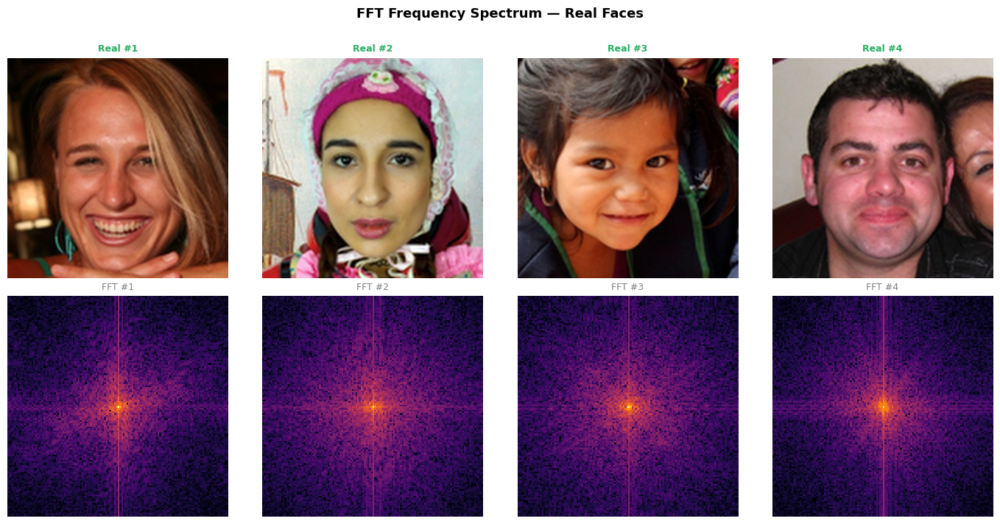

Saved: /kaggle/working/deepfake_results/plots/fft/fft_grid_real.png


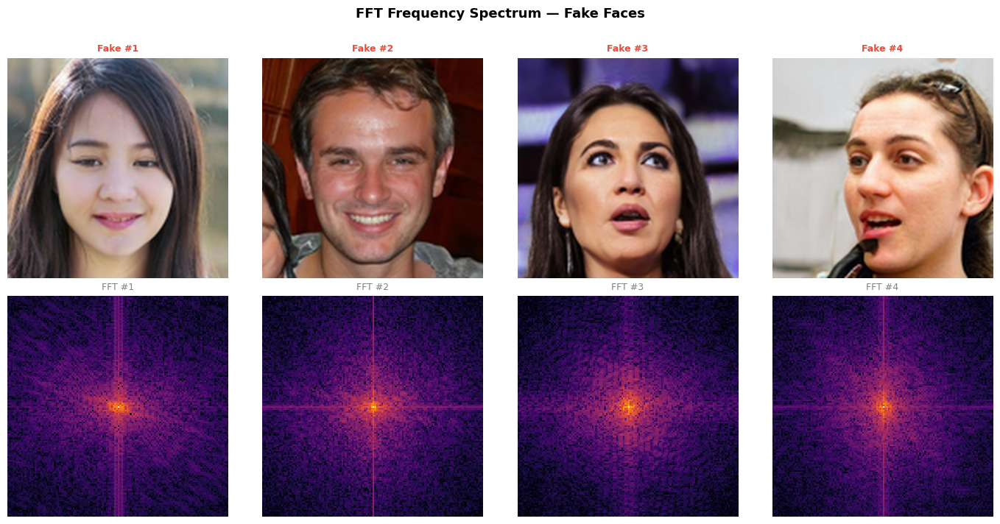

Saved: /kaggle/working/deepfake_results/plots/fft/fft_grid_fake.png


In [33]:
def plot_fft_grid(images, label, color, n_cols=4):
    n   = min(len(images), n_cols)
    fig, axes = plt.subplots(2, n, figsize=(n * 3.5, 7))
    for j, img in enumerate(images[:n]):
        spec = compute_fft_spectrum(img)
        axes[0][j].imshow(img, interpolation='lanczos')
        axes[0][j].set_title(f'{label} #{j+1}', fontsize=9, fontweight='bold', color=color)
        axes[0][j].axis('off')
        axes[1][j].imshow(spec, cmap='inferno', interpolation='nearest')
        axes[1][j].set_title(f'FFT #{j+1}', fontsize=9, color='gray')
        axes[1][j].axis('off')
    plt.suptitle(f'FFT Frequency Spectrum — {label} Faces',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    path = os.path.join(OUTPUT_DIR, 'plots', 'fft', f'fft_grid_{label.lower()}.png')
    plt.savefig(path, bbox_inches='tight', dpi=150); plt.show()
    print('Saved:', path)

plot_fft_grid(real_images, 'Real', '#27ae60')
plot_fft_grid(fake_images, 'Fake', '#e74c3c')

### Side-by-side Real vs Fake FFT

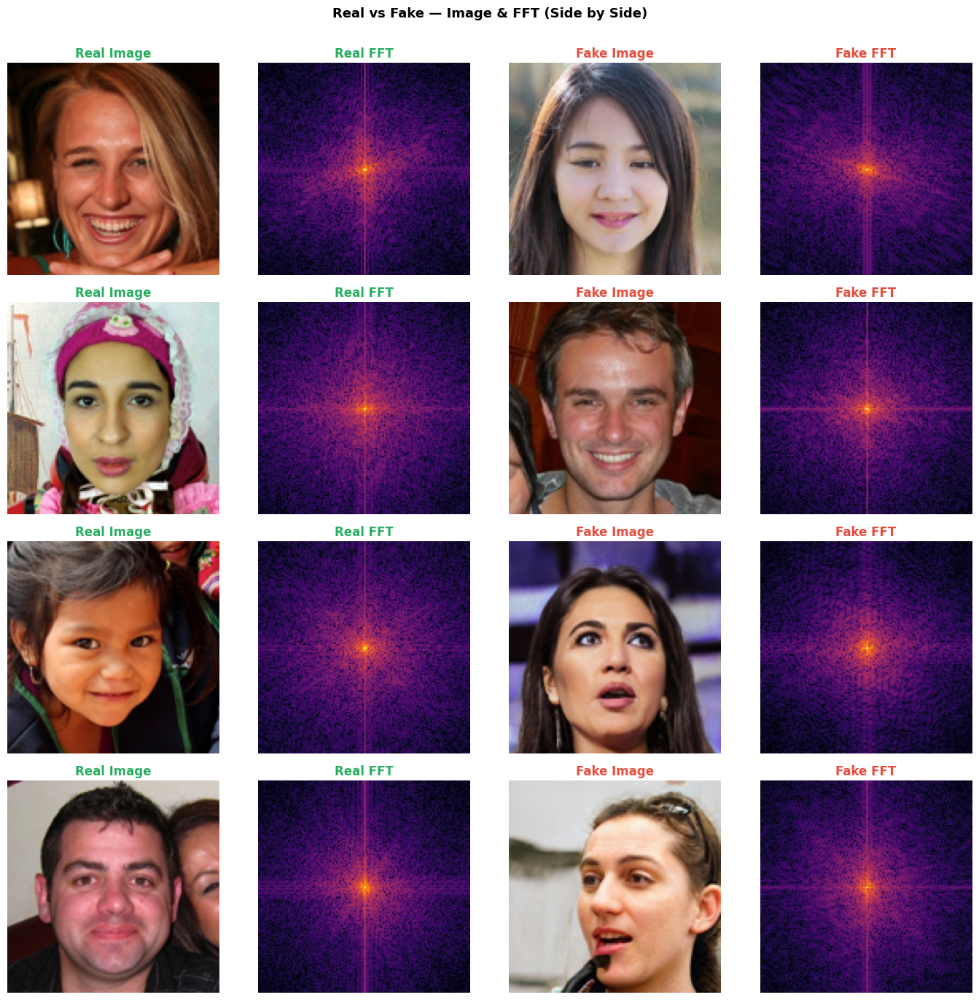

Saved: /kaggle/working/deepfake_results/plots/fft/fft_sidebyside.png


In [34]:
n_pairs = min(4, len(real_images), len(fake_images))
fig, axes = plt.subplots(n_pairs, 4, figsize=(14, n_pairs * 3.4))
for row in range(n_pairs):
    for col, (img, title, color) in enumerate([
        (real_images[row],                     'Real Image', '#27ae60'),
        (compute_fft_spectrum(real_images[row]),'Real FFT',  '#27ae60'),
        (fake_images[row],                     'Fake Image', '#e74c3c'),
        (compute_fft_spectrum(fake_images[row]),'Fake FFT',  '#e74c3c'),
    ]):
        ax = axes[row][col]
        ax.imshow(img, cmap='inferno' if 'FFT' in title else None)
        ax.set_title(title, fontweight='bold', color=color)
        ax.axis('off')

plt.suptitle('Real vs Fake — Image & FFT (Side by Side)',
             fontsize=13, fontweight='bold', y=1.005)
plt.tight_layout()
path = os.path.join(OUTPUT_DIR, 'plots', 'fft', 'fft_sidebyside.png')
plt.savefig(path, bbox_inches='tight', dpi=150); plt.show()
print('Saved:', path)

### Radial frequency profiles

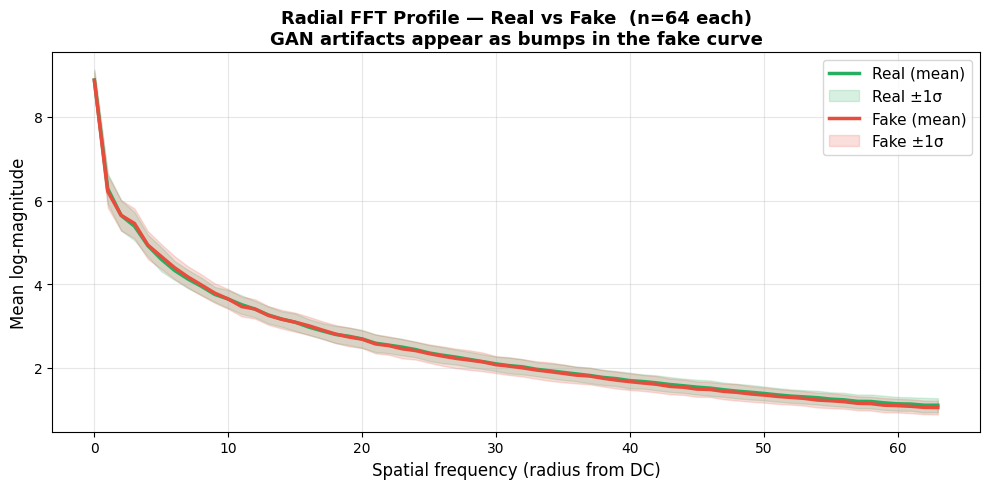

Saved: /kaggle/working/deepfake_results/plots/fft/fft_radial_profile.png


In [35]:
def mean_radial_profile(images):
    profiles = []
    for img in images:
        spec          = compute_fft_spectrum(img)
        radii, profile = compute_azimuthal_average(spec)
        profiles.append(profile)
    min_len = min(len(p) for p in profiles)
    stacked = np.stack([p[:min_len] for p in profiles])
    return radii[:min_len], stacked.mean(axis=0), stacked.std(axis=0)

r_radii, r_mean, r_std = mean_radial_profile(real_images)
f_radii, f_mean, f_std = mean_radial_profile(fake_images)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(r_radii, r_mean, color='#27ae60', lw=2.5, label='Real (mean)')
ax.fill_between(r_radii, r_mean - r_std, r_mean + r_std,
                color='#27ae60', alpha=0.18, label='Real ±1σ')
ax.plot(f_radii, f_mean, color='#e74c3c', lw=2.5, label='Fake (mean)')
ax.fill_between(f_radii, f_mean - f_std, f_mean + f_std,
                color='#e74c3c', alpha=0.18, label='Fake ±1σ')
ax.set_xlabel('Spatial frequency (radius from DC)', fontsize=12)
ax.set_ylabel('Mean log-magnitude', fontsize=12)
ax.set_title(f'Radial FFT Profile — Real vs Fake  (n={N_SAMPLES} each)\n'
             'GAN artifacts appear as bumps in the fake curve',
             fontsize=13, fontweight='bold')
ax.legend(fontsize=11); ax.grid(alpha=0.3)
plt.tight_layout()
path = os.path.join(OUTPUT_DIR, 'plots', 'fft', 'fft_radial_profile.png')
plt.savefig(path, dpi=150); plt.show()
print('Saved:', path)

### Mean spectrum heatmap & difference map

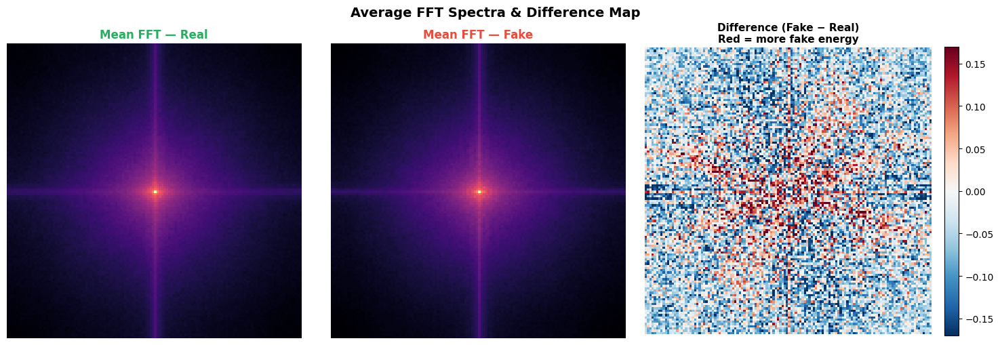

Saved: /kaggle/working/deepfake_results/plots/fft/fft_mean_spectra.png


In [36]:
SPEC_SIZE = (128, 128)   # fixed size for spectrum comparison
real_mean_spec = mean_spectrum(real_images, SPEC_SIZE)
fake_mean_spec = mean_spectrum(fake_images, SPEC_SIZE)
diff_spec      = fake_mean_spec - real_mean_spec

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(real_mean_spec, cmap='magma'); axes[0].axis('off')
axes[0].set_title('Mean FFT — Real', fontsize=12, fontweight='bold', color='#27ae60')
axes[1].imshow(fake_mean_spec, cmap='magma'); axes[1].axis('off')
axes[1].set_title('Mean FFT — Fake', fontsize=12, fontweight='bold', color='#e74c3c')
vmax = np.percentile(np.abs(diff_spec), 95)
im   = axes[2].imshow(diff_spec, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
axes[2].axis('off')
axes[2].set_title('Difference (Fake − Real)\nRed = more fake energy',
                  fontsize=11, fontweight='bold')
plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
plt.suptitle('Average FFT Spectra & Difference Map',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
path = os.path.join(OUTPUT_DIR, 'plots', 'fft', 'fft_mean_spectra.png')
plt.savefig(path, bbox_inches='tight', dpi=150); plt.show()
print('Saved:', path)

## SECTION B — Grad-CAM Heatmaps

### Grad-CAM implementation

In [39]:
def find_last_conv_layer(model):
    def _all_layers(m):
        result = []
        for layer in m.layers:
            if hasattr(layer, 'layers'):
                result.extend(_all_layers(layer))
            else:
                result.append(layer)
        return result

    for layer in reversed(_all_layers(model)):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    raise ValueError(f'No Conv2D layer found in {model.name}')


def make_gradcam_heatmap(img_array, model, last_conv_name, target_class=None):
    img_tensor = tf.cast(img_array, tf.float32)

    if isinstance(model, tf.keras.Sequential):
        # Keras 3 fix: rebuild functional model layer by layer for Sequential
        inp = tf.keras.Input(shape=img_array.shape[1:])
        x = inp
        conv_out_tensor = None
        for layer in model.layers:
            x = layer(x)
            if layer.name == last_conv_name:
                conv_out_tensor = x
        grad_model = tf.keras.models.Model(inputs=inp, outputs=[conv_out_tensor, x])
    else:
        # Functional model (VGG16, ResNet50)
        grad_model = tf.keras.models.Model(
            inputs=model.inputs,
            outputs=[model.get_layer(last_conv_name).output, model.output]
        )

    with tf.GradientTape() as tape:
        inputs = tf.cast(img_array, tf.float32)
        conv_outputs, preds = grad_model(inputs)
        pred_score = float(preds[0][0])

        if target_class is None:
            target_class = int(pred_score >= 0.5)

        if target_class == 1:
            loss = preds[:, 0]
        else:
            loss = 1.0 - preds[:, 0]

    grads    = tape.gradient(loss, conv_outputs)
    pooled   = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_out = conv_outputs[0]
    heatmap  = conv_out @ pooled[..., tf.newaxis]
    heatmap  = tf.squeeze(heatmap)
    heatmap  = tf.maximum(heatmap, 0)
    heatmap  = heatmap / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), pred_score


def overlay_heatmap(img_array, heatmap, alpha=0.45):
    H, W       = img_array.shape[:2]
    hm_uint8   = np.uint8(255 * heatmap)
    hm_resized = cv2.resize(hm_uint8, (W, H))
    hm_colored = cv2.applyColorMap(hm_resized, cv2.COLORMAP_VIRIDIS)
    hm_rgb     = cv2.cvtColor(hm_colored, cv2.COLOR_BGR2RGB)
    img_uint8  = np.uint8(img_array * 255)
    blended    = (img_uint8 * (1 - alpha) + hm_rgb * alpha).astype(np.uint8)
    return blended


# Pre-compute last conv layer names for all models
LAST_CONV = {}
for name, _, _ in MODEL_CONFIGS:
    try:
        LAST_CONV[name] = find_last_conv_layer(loaded_models[name])
        print(f'  {name:10s}: last conv = {LAST_CONV[name]}')
    except ValueError as e:
        print(f'  {name}: WARNING — {e}')

  LeNet     : last conv = conv2d_3
  AlexNet   : last conv = conv2d_8
  VGG16     : last conv = block5_conv3
  ResNet50  : last conv = conv5_block3_3_conv


### Grad-CAM across all models (one real + one fake image)

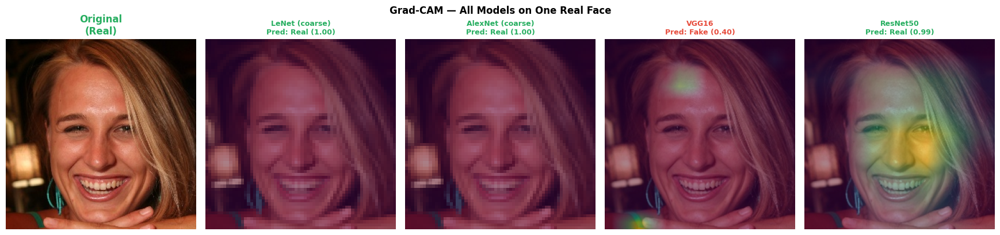

Saved: /kaggle/working/deepfake_results/plots/gradcam/gradcam_real_face.png


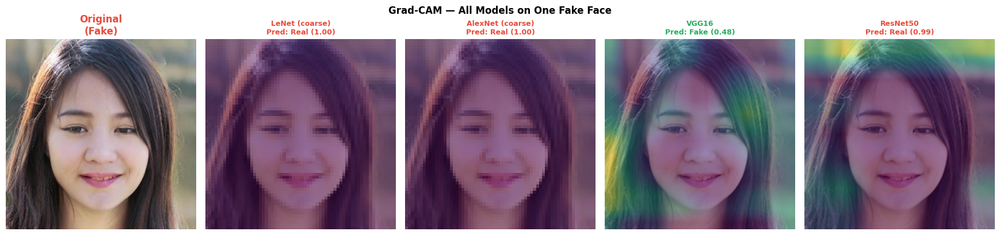

Saved: /kaggle/working/deepfake_results/plots/gradcam/gradcam_fake_face.png


In [40]:
def gradcam_across_models(raw_pil, true_label_str):
    n_models  = len(MODEL_CONFIGS)
    fig, axes = plt.subplots(1, n_models + 1, figsize=((n_models + 1) * 3.5, 4))

    # Column 0: original
    axes[0].imshow(raw_pil)
    color = '#27ae60' if true_label_str == 'Real' else '#e74c3c'
    axes[0].set_title(f'Original\n({true_label_str})', fontweight='bold', color=color)
    axes[0].axis('off')

    for col_idx, (name, _, img_size) in enumerate(MODEL_CONFIGS):
        if name not in LAST_CONV:
            axes[col_idx + 1].axis('off'); continue

        resized   = raw_pil.resize((img_size, img_size))
        img_arr   = np.array(resized, dtype=np.float32) / 255.0
        inp       = img_arr[np.newaxis, ...]

        # Request heatmap for the TRUE class so we always see correct-class saliency
        target    = 1 if true_label_str == 'Real' else 0
        heatmap, pred = make_gradcam_heatmap(inp, loaded_models[name], LAST_CONV[name],
                                             target_class=target)
        overlay   = overlay_heatmap(img_arr, heatmap)

        pred_label = 'Real' if pred >= 0.5 else 'Fake'
        correct    = pred_label == true_label_str
        tc         = '#27ae60' if correct else '#e74c3c'

        # Note: 64×64 models produce very coarse heatmaps due to small feature maps
        note = ' (coarse)' if img_size == 64 else ''
        axes[col_idx + 1].imshow(overlay)
        axes[col_idx + 1].set_title(
            f'{name}{note}\nPred: {pred_label} ({pred:.2f})',
            fontsize=9, fontweight='bold', color=tc,
        )
        axes[col_idx + 1].axis('off')

    plt.suptitle(f'Grad-CAM — All Models on One {true_label_str} Face',
                 fontsize=12, fontweight='bold', y=1.01)
    plt.tight_layout()
    return fig

real_pil = Image.open(real_paths_all[0]).convert('RGB')
fake_pil = Image.open(fake_paths_all[0]).convert('RGB')

fig_real = gradcam_across_models(real_pil, 'Real')
path = os.path.join(OUTPUT_DIR, 'plots', 'gradcam', 'gradcam_real_face.png')
fig_real.savefig(path, bbox_inches='tight', dpi=150); plt.show(); print('Saved:', path)

fig_fake = gradcam_across_models(fake_pil, 'Fake')
path = os.path.join(OUTPUT_DIR, 'plots', 'gradcam', 'gradcam_fake_face.png')
fig_fake.savefig(path, bbox_inches='tight', dpi=150); plt.show(); print('Saved:', path)

### Per-model Grad-CAM batch grid (VGG16 & ResNet50)

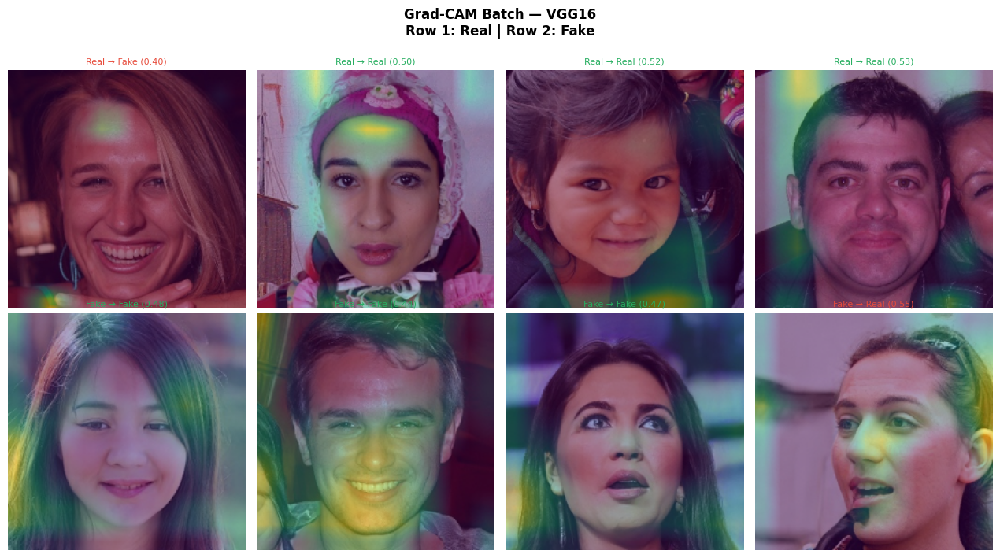

Saved: /kaggle/working/deepfake_results/plots/gradcam/gradcam_batch_VGG16.png


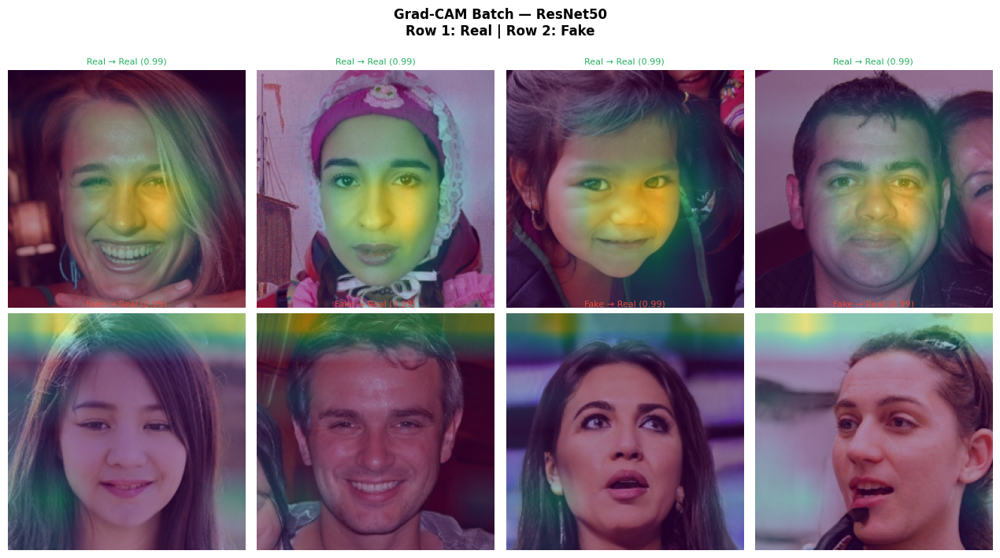

Saved: /kaggle/working/deepfake_results/plots/gradcam/gradcam_batch_ResNet50.png


In [41]:
def gradcam_batch_grid(model_name, img_size, n_show=4):
    """2×n_show grid: row 0 = real, row 1 = fake."""
    model     = loaded_models[model_name]
    conv_name = LAST_CONV[model_name]
    size      = (img_size, img_size)

    real_batch = real_paths_all[:n_show]
    fake_batch = fake_paths_all[:n_show]

    fig, axes = plt.subplots(2, n_show, figsize=(n_show * 3.2, 7))
    for row_idx, (paths, true_str) in enumerate([(real_batch, 'Real'), (fake_batch, 'Fake')]):
        target = 1 if true_str == 'Real' else 0
        color  = '#27ae60' if true_str == 'Real' else '#e74c3c'
        for col_idx, p in enumerate(paths):
            pil  = Image.open(p).convert('RGB').resize(size)
            arr  = np.array(pil, dtype=np.float32) / 255.0
            inp  = arr[np.newaxis, ...]
            hm, pr = make_gradcam_heatmap(inp, model, conv_name, target_class=target)
            overlay   = overlay_heatmap(arr, hm)
            pred_label = 'Real' if pr >= 0.5 else 'Fake'
            correct    = pred_label == true_str
            tc         = '#27ae60' if correct else '#e74c3c'
            axes[row_idx][col_idx].imshow(overlay)
            axes[row_idx][col_idx].set_title(
                f'{true_str} → {pred_label} ({pr:.2f})', fontsize=8, color=tc
            )
            axes[row_idx][col_idx].axis('off')

    plt.suptitle(f'Grad-CAM Batch — {model_name}\nRow 1: Real | Row 2: Fake',
                 fontsize=12, fontweight='bold', y=1.01)
    plt.tight_layout()
    path = os.path.join(OUTPUT_DIR, 'plots', 'gradcam', f'gradcam_batch_{model_name}.png')
    plt.savefig(path, bbox_inches='tight', dpi=150); plt.show(); print('Saved:', path)

# Run only for the large pretrained models — 64×64 heatmaps are too coarse
for m_name in ('VGG16', 'ResNet50'):
    if m_name in LAST_CONV:
        gradcam_batch_grid(m_name, img_size=224, n_show=4)

## SECTION C — Combined Audit Panel: Image · FFT · Grad-CAM

### Best model selection

In [43]:
import pandas as pd
df_metrics = pd.read_csv(os.path.join(MODELS_DIR, 'comparison_table.csv'))
best_name  = df_metrics.loc[df_metrics['F1-Score'].idxmax(), 'Model']
best_size  = next(s for n, _, s in MODEL_CONFIGS if n == best_name)
print(f'Best model by F1-Score: {best_name} (img_size={best_size})')

Best model by F1-Score: VGG16 (img_size=224)


### Tri-panel audit strip

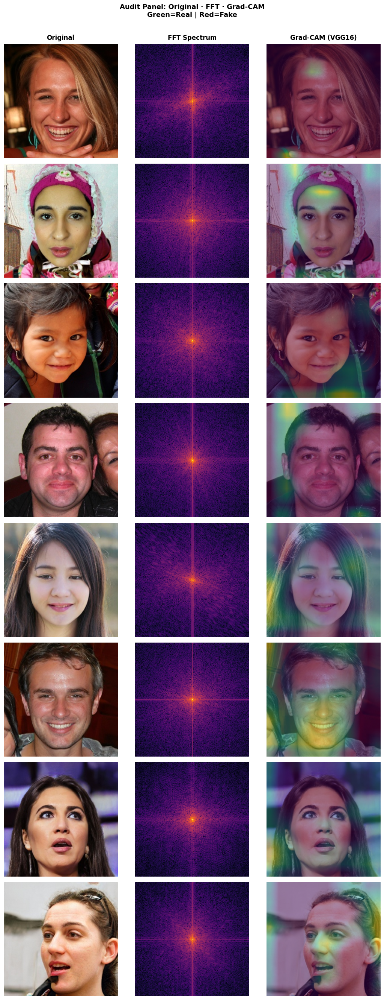

Saved: /kaggle/working/deepfake_results/plots/combined/audit_panel.png


In [44]:
def tripanel_audit(real_paths, fake_paths, n_show=4):
    model     = loaded_models[best_name]
    conv_name = LAST_CONV[best_name]
    size      = (best_size, best_size)

    all_items = ([(p, 'Real') for p in real_paths[:n_show]] +
                 [(p, 'Fake') for p in fake_paths[:n_show]])
    n_total   = len(all_items)
    fig, axes = plt.subplots(n_total, 3, figsize=(11, n_total * 3.3))
    if n_total == 1:
        axes = axes[np.newaxis, :]

    for col, lbl in enumerate(['Original', 'FFT Spectrum', f'Grad-CAM ({best_name})']):
        axes[0][col].set_title(lbl, fontsize=12, fontweight='bold', pad=8)

    for row_idx, (p, true_str) in enumerate(all_items):
        border = '#27ae60' if true_str == 'Real' else '#e74c3c'
        pil    = Image.open(p).convert('RGB').resize(size)
        arr    = np.array(pil, dtype=np.float32) / 255.0
        spec   = compute_fft_spectrum(arr)
        target = 1 if true_str == 'Real' else 0
        hm, pr = make_gradcam_heatmap(arr[np.newaxis, ...], model, conv_name,
                                      target_class=target)
        overlay    = overlay_heatmap(arr, hm)
        pred_label = 'Real' if pr >= 0.5 else 'Fake'
        tc         = '#27ae60' if pred_label == true_str else '#e74c3c'

        axes[row_idx][0].imshow(arr)
        axes[row_idx][0].set_ylabel(true_str, fontsize=11, fontweight='bold',
                                    color=border, rotation=90, labelpad=6)
        axes[row_idx][0].axis('off')
        axes[row_idx][1].imshow(spec, cmap='inferno'); axes[row_idx][1].axis('off')
        axes[row_idx][2].imshow(overlay)
        axes[row_idx][2].set_xlabel(f'Pred: {pred_label} ({pr:.2f})', fontsize=9, color=tc)
        axes[row_idx][2].axis('off')
        for col in range(3):
            for spine in axes[row_idx][col].spines.values():
                spine.set_visible(True); spine.set_color(border); spine.set_linewidth(2.5)

    plt.suptitle('Audit Panel: Original · FFT · Grad-CAM\nGreen=Real | Red=Fake',
                 fontsize=13, fontweight='bold', y=1.005)
    plt.tight_layout()
    return fig

fig_audit = tripanel_audit(real_paths_all, fake_paths_all, n_show=4)
path = os.path.join(OUTPUT_DIR, 'plots', 'combined', 'audit_panel.png')
fig_audit.savefig(path, bbox_inches='tight', dpi=150); plt.show(); print('Saved:', path)

### Failure analysis

625/625 ━━━━━━━━━━━━━━━━━━━━ 157s 223ms/step
VGG16: 1040 misclassifications out of 20000


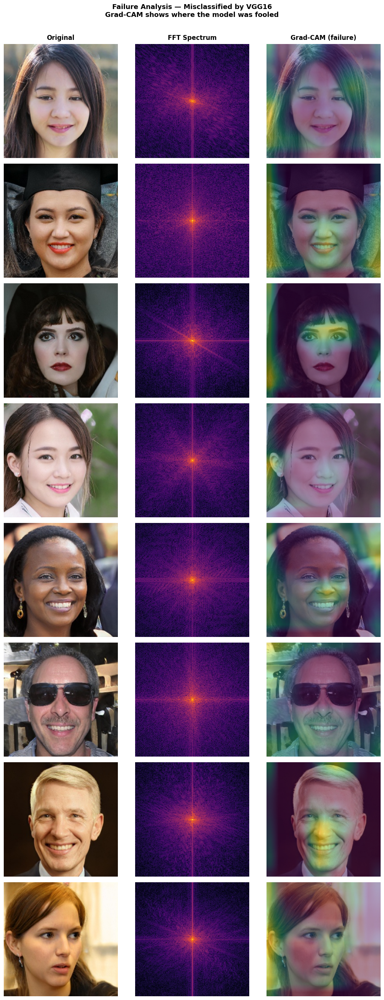

Saved: /kaggle/working/deepfake_results/plots/combined/failure_analysis.png


In [45]:
def find_misclassified(model_name, img_size, max_fail=8):
    model      = loaded_models[model_name]
    conv_name  = LAST_CONV[model_name]
    size       = (img_size, img_size)
    test_gen   = test_224_vgg if model_name == 'VGG16' else \
                 test_224_res if model_name == 'ResNet50' else test_64

    test_gen.reset()
    n_true  = test_gen.samples
    y_prob  = model.predict(test_gen, verbose=1).flatten()[:n_true]
    y_pred  = (y_prob >= 0.5).astype(int)
    y_true  = test_gen.classes

    wrong_idx = np.where(y_pred != y_true)[0]
    print(f'{model_name}: {len(wrong_idx)} misclassifications out of {n_true}')

    misclassified = []
    all_paths_gen = [os.path.join(TEST_DIR, f) for f in test_gen.filenames]

    for idx in wrong_idx[:max_fail]:
        p          = all_paths_gen[idx]
        true_label = 'Real' if y_true[idx] == 1 else 'Fake'
        pr         = float(y_prob[idx])
        pil        = Image.open(p).convert('RGB').resize(size)
        arr        = np.array(pil, dtype=np.float32) / 255.0
        target     = y_true[idx]
        hm, _      = make_gradcam_heatmap(arr[np.newaxis, ...], model, conv_name,
                                          target_class=int(target))
        misclassified.append((arr, true_label, pr, hm))
    return misclassified

misclassified = find_misclassified(best_name, best_size, max_fail=8)

if misclassified:
    n   = len(misclassified)
    fig, axes = plt.subplots(n, 3, figsize=(11, n * 3.3))
    if n == 1:
        axes = axes[np.newaxis, :]
    for col, lbl in enumerate(['Original', 'FFT Spectrum', 'Grad-CAM (failure)']):
        axes[0][col].set_title(lbl, fontsize=12, fontweight='bold', pad=8)
    for row_idx, (arr, true_str, pr, hm) in enumerate(misclassified):
        pred_label = 'Real' if pr >= 0.5 else 'Fake'
        spec       = compute_fft_spectrum(arr)
        overlay    = overlay_heatmap(arr, hm)
        axes[row_idx][0].imshow(arr)
        axes[row_idx][0].set_ylabel(
            f'True: {true_str}', fontsize=10,
            color='#27ae60' if true_str == 'Real' else '#e74c3c',
            rotation=90, labelpad=6,
        )
        axes[row_idx][0].axis('off')
        axes[row_idx][1].imshow(spec, cmap='inferno'); axes[row_idx][1].axis('off')
        axes[row_idx][2].imshow(overlay)
        axes[row_idx][2].set_xlabel(
            f'Pred: {pred_label} ({pr:.2f}) <- WRONG', fontsize=9, color='#e74c3c'
        )
        axes[row_idx][2].axis('off')
    plt.suptitle(f'Failure Analysis — Misclassified by {best_name}\n'
                 'Grad-CAM shows where the model was fooled',
                 fontsize=13, fontweight='bold', y=1.005)
    plt.tight_layout()
    path = os.path.join(OUTPUT_DIR, 'plots', 'combined', 'failure_analysis.png')
    plt.savefig(path, bbox_inches='tight', dpi=150); plt.show(); print('Saved:', path)
else:
    print(f'No misclassifications found in the test set for {best_name}.')

## SECTION D — Interactive: Analyse a Custom Image

### Upload and analyse

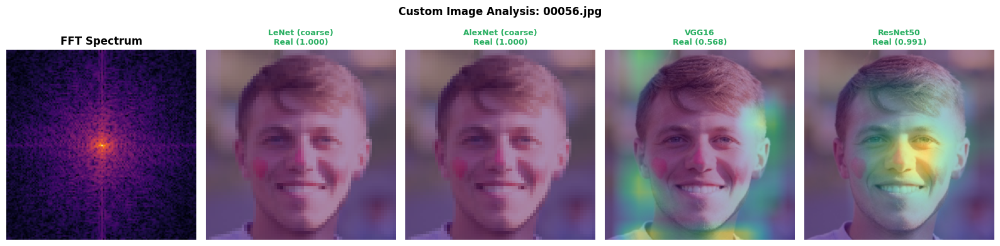

Saved: /kaggle/working/deepfake_results/plots/combined/custom_00056.png


In [46]:
# Section D — Custom image analysis
# On Kaggle, use a hardcoded test image instead of file upload
test_image_path = real_paths_all[10]  # change index to try different images
pil_img = Image.open(test_image_path).convert('RGB')

fname = os.path.basename(test_image_path)
n_cols = len(MODEL_CONFIGS)
fig, axes = plt.subplots(1, n_cols + 1, figsize=((n_cols + 1) * 3.2, 4))

img_fft = np.array(pil_img.resize((128, 128)), dtype=np.float32) / 255.0
spec    = compute_fft_spectrum(img_fft)
axes[0].imshow(spec, cmap='inferno'); axes[0].axis('off')
axes[0].set_title('FFT Spectrum', fontweight='bold')

for col_idx, (name, _, img_size) in enumerate(MODEL_CONFIGS):
    if name not in LAST_CONV:
        axes[col_idx + 1].axis('off'); continue
    resized = pil_img.resize((img_size, img_size))
    arr     = np.array(resized, dtype=np.float32) / 255.0
    inp     = arr[np.newaxis, ...]
    hm, pr  = make_gradcam_heatmap(inp, loaded_models[name], LAST_CONV[name])
    overlay    = overlay_heatmap(arr, hm)
    pred_label = 'Real' if pr >= 0.5 else 'Fake'
    color      = '#27ae60' if pred_label == 'Real' else '#e74c3c'
    note       = ' (coarse)' if img_size == 64 else ''
    axes[col_idx + 1].imshow(overlay); axes[col_idx + 1].axis('off')
    axes[col_idx + 1].set_title(
        f'{name}{note}\n{pred_label} ({pr:.3f})',
        fontsize=9, fontweight='bold', color=color,
    )

plt.suptitle(f'Custom Image Analysis: {fname}',
             fontsize=12, fontweight='bold', y=1.01)
plt.tight_layout()
path = os.path.join(OUTPUT_DIR, 'plots', 'combined',
                    f'custom_{os.path.splitext(fname)[0]}.png')
plt.savefig(path, bbox_inches='tight', dpi=150); plt.show(); print('Saved:', path)

### Summary

In [47]:
print('\n' + '=' * 60)
print('  NOTEBOOK 2 COMPLETE — all outputs saved to:')
print(f'  {OUTPUT_DIR}')
print('=' * 60)
print("""
  plots/fft/
    fft_grid_real.png          FFT grid — real faces
    fft_grid_fake.png          FFT grid — fake faces
    fft_sidebyside.png         Side-by-side comparison
    fft_radial_profile.png     Radial frequency profiles ±1σ
    fft_mean_spectra.png       Mean spectra & difference map

  plots/gradcam/
    gradcam_real_face.png      All models on one real image
    gradcam_fake_face.png      All models on one fake image
    gradcam_batch_VGG16.png    VGG16 batch grid
    gradcam_batch_ResNet50.png ResNet50 batch grid

  plots/combined/
    audit_panel.png            Tri-panel: image · FFT · Grad-CAM
    failure_analysis.png       Misclassified examples
""")


  NOTEBOOK 2 COMPLETE — all outputs saved to:
  /kaggle/working/deepfake_results

  plots/fft/
    fft_grid_real.png          FFT grid — real faces
    fft_grid_fake.png          FFT grid — fake faces
    fft_sidebyside.png         Side-by-side comparison
    fft_radial_profile.png     Radial frequency profiles ±1σ
    fft_mean_spectra.png       Mean spectra & difference map

  plots/gradcam/
    gradcam_real_face.png      All models on one real image
    gradcam_fake_face.png      All models on one fake image
    gradcam_batch_VGG16.png    VGG16 batch grid
    gradcam_batch_ResNet50.png ResNet50 batch grid

  plots/combined/
    audit_panel.png            Tri-panel: image · FFT · Grad-CAM
    failure_analysis.png       Misclassified examples

